In [1]:
# Data manipulation and analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# Scientific computing
import scipy
# Machine learning
import sklearn
from scipy.stats import shapiro
from scipy.stats import kstest
from scipy.stats import ttest_1samp
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from scipy import stats
import seaborn as sns
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

In [4]:
# Read the CSV file into a DataFrame
df = pd.read_csv(r"F:\Climate Paper\Data\My Research Data.csv")

# Print the first five rows of the DataFrame
df.head()

,year,Bhutan,Bangladesh,India,Nepal,Pakistan,Sri Lanka
0,1850,0.23,6.34,83.03,1.14,-0.03,6.41
1,1851,0.21,5.41,64.25,1.04,-0.05,5.95
2,1852,0.37,5.27,54.26,1.00,-0.07,5.66
3,1853,0.28,5.06,48.19,0.97,-0.10,5.47
4,1854,0.27,5.25,43.87,0.95,-0.11,5.51


## Basic Statistics

In [5]:
# Display column names
print(df.columns)

Index(['year', 'Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan',
       'Sri Lanka'],
      dtype='object')


In [6]:
# Summary statistics
print(df.describe())

              year      Bhutan  Bangladesh       India       Nepal  \
count   172.000000  172.000000  172.000000  172.000000  172.000000   
mean   1935.500000    1.700116    7.579477   71.021163    3.556512   
std      49.796252    1.370469    3.748789   53.243898    2.032533   
min    1850.000000    0.130000   -0.990000   16.230000    0.900000   
25%    1892.750000    0.420000    5.530000   32.147500    1.515000   
50%    1935.500000    1.370000    7.190000   43.235000    3.670000   
75%    1978.250000    3.102500    8.620000  110.140000    4.690000   
max    2021.000000    4.730000   22.750000  222.850000   12.100000   

         Pakistan   Sri Lanka  
count  172.000000  172.000000  
mean     5.317151    4.462035  
std      7.798001    3.695627  
min     -5.390000    0.650000  
25%     -0.342500    2.517500  
50%      2.375000    3.375000  
75%      7.472500    5.582500  
max     27.150000   32.330000  


In [7]:
yearly_avg = df.groupby('year').mean()
print(yearly_avg)

      Bhutan  Bangladesh  India  Nepal  Pakistan  Sri Lanka
year                                                       
1850    0.23        6.34  83.03   1.14     -0.03       6.41
1851    0.21        5.41  64.25   1.04     -0.05       5.95
1852    0.37        5.27  54.26   1.00     -0.07       5.66
1853    0.28        5.06  48.19   0.97     -0.10       5.47
1854    0.27        5.25  43.87   0.95     -0.11       5.51
...      ...         ...    ...    ...       ...        ...
2017    2.02        5.24  50.33   4.04      7.10       2.90
2018    2.12        3.46  42.79   4.14      6.97       2.85
2019    1.86        5.54  36.65   4.17      6.90       2.79
2020    1.88        5.65  29.68   4.17      6.81       2.74
2021    1.80        5.32  23.28   4.12      6.70       2.69

[172 rows x 6 columns]


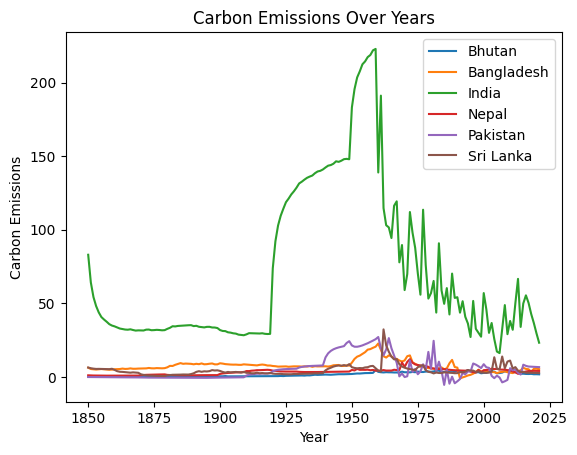

In [8]:
# Line plot for each country
for country in df.columns[1:]:
    plt.plot(df['year'], df[country], label=country)
plt.xlabel('Year')
plt.ylabel('Carbon Emissions')
plt.title('Carbon Emissions Over Years')
plt.legend()
plt.show()

                year    Bhutan  Bangladesh     India     Nepal  Pakistan  \
year        1.000000  0.862265   -0.065880  0.200478  0.706195  0.353136   
Bhutan      0.862265  1.000000    0.058645  0.274751  0.727233  0.395556   
Bangladesh -0.065880  0.058645    1.000000  0.611119  0.217234  0.544923   
India       0.200478  0.274751    0.611119  1.000000  0.311993  0.813894   
Nepal       0.706195  0.727233    0.217234  0.311993  1.000000  0.333609   
Pakistan    0.353136  0.395556    0.544923  0.813894  0.333609  1.000000   
Sri Lanka   0.268149  0.384135    0.285691  0.270641  0.257303  0.401984   

            Sri Lanka  
year         0.268149  
Bhutan       0.384135  
Bangladesh   0.285691  
India        0.270641  
Nepal        0.257303  
Pakistan     0.401984  
Sri Lanka    1.000000  


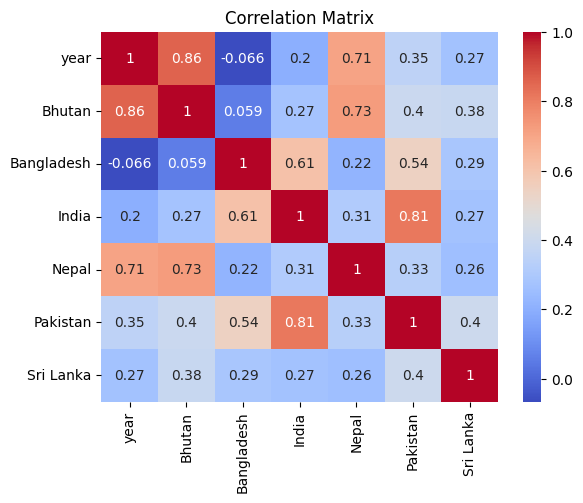

In [9]:
# Correlation between countries
correlation_matrix = df.corr()
print(correlation_matrix)

# Heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


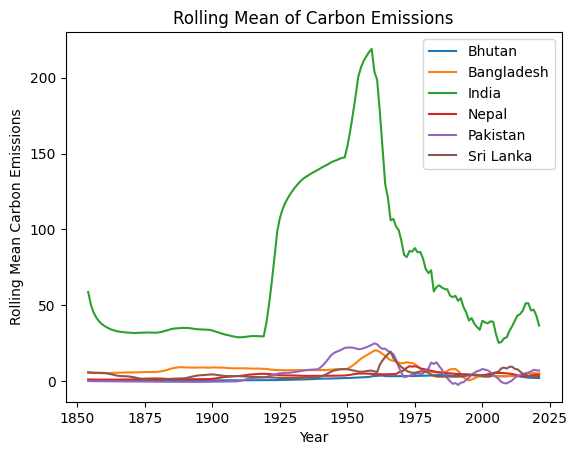

In [10]:
# Rolling mean to observe trends
for country in df.columns[1:]:
    df[country + '_rolling_mean'] = df[country].rolling(window=5).mean()

# Plot rolling means
for country in df.columns[1:7]:
    plt.plot(df['year'], df[country + '_rolling_mean'], label=country)
plt.xlabel('Year')
plt.ylabel('Rolling Mean Carbon Emissions')
plt.title('Rolling Mean of Carbon Emissions')
plt.legend()
plt.show()


In [11]:
from scipy import stats

# One-Way ANOVA
anova_results = stats.f_oneway(df['Bhutan'], df['Bangladesh'], df['India'], df['Nepal'], df['Pakistan'], df['Sri Lanka'])
print(f'ANOVA results: F={anova_results.statistic}, p={anova_results.pvalue}')

ANOVA results: F=260.96448493387993, p=5.656755496000004e-180


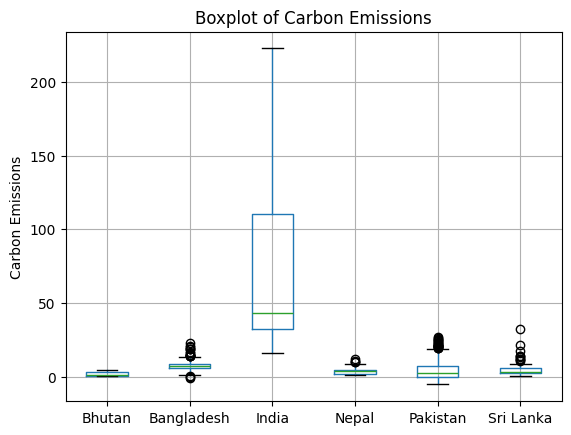

In [13]:
# Boxplot for each country
df.boxplot(column=['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka'])
plt.title('Boxplot of Carbon Emissions')
plt.ylabel('Carbon Emissions')
plt.show()

## Inferential Statistics 

In [15]:
from scipy import stats

# One Sample T-Test
t_stat, p_val = stats.ttest_1samp(df['India'], popmean=0)  # Replace 0 with your mean value of interest
print(f'One Sample T-Test results: t-statistic = {t_stat}, p-value = {p_val}')

One Sample T-Test results: t-statistic = 17.49371949141101, p-value = 6.099575954525683e-40


In [16]:
# Independent T-Test
t_stat, p_val = stats.ttest_ind(df['India'], df['Pakistan'])
print(f'Independent T-Test results: t-statistic = {t_stat}, p-value = {p_val}')

Independent T-Test results: t-statistic = 16.01318474327788, p-value = 1.849822099401669e-43


In [17]:
# Paired T-Test
t_stat, p_val = stats.ttest_rel(df['India'], df['Bangladesh'])
print(f'Paired T-Test results: t-statistic = {t_stat}, p-value = {p_val}')

Paired T-Test results: t-statistic = 16.301759793431, p-value = 1.1818535657188013e-36


In [18]:
# ANOVA (Analysis of Variance):

In [19]:
# One-Way ANOVA
f_stat, p_val = stats.f_oneway(df['Bhutan'], df['Bangladesh'], df['India'], df['Nepal'], df['Pakistan'], df['Sri Lanka'])
print(f'ANOVA results: F-statistic = {f_stat}, p-value = {p_val}')

ANOVA results: F-statistic = 260.96448493387993, p-value = 5.656755496000004e-180


In [21]:
# Chi-Square Test
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['year'], df['Pakistan'])  # Replace 'country_column' with your categorical column name
chi2, p_val, dof, expected = chi2_contingency(contingency_table)
print(f'Chi-Square Test results: chi2 = {chi2}, p-value = {p_val}, dof = {dof}')

Chi-Square Test results: chi2 = 26660.0, p-value = 0.24990149685182847, dof = 26505


In [22]:
# Pearson Correlation Coefficient
corr_coef, p_val = stats.pearsonr(df['India'], df['Pakistan'])
print(f'Pearson Correlation Coefficient: {corr_coef}, p-value = {p_val}')

Pearson Correlation Coefficient: 0.813894114604548, p-value = 6.107379090840462e-42


In [23]:
import statsmodels.api as sm

# Simple Linear Regression
X = df['year']
Y = df['India']
X = sm.add_constant(X)  # Adds a constant term to the predictor
model = sm.OLS(Y, X).fit()
predictions = model.predict(X)

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  India   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     7.119
Date:                Fri, 29 Nov 2024   Prob (F-statistic):            0.00837
Time:                        23:18:32   Log-Likelihood:                -923.71
No. Observations:                 172   AIC:                             1851.
Df Residuals:                     170   BIC:                             1858.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -343.8694    155.553     -2.211      0.0

In [24]:
# Mann-Whitney U Test
u_stat, p_val = stats.mannwhitneyu(df['India'], df['Pakistan'])
print(f'Mann-Whitney U Test results: U-statistic = {u_stat}, p-value = {p_val}')

Mann-Whitney U Test results: U-statistic = 29526.0, p-value = 1.88791105305219e-57


## Advanced Statistics

In [25]:
import statsmodels.api as sm

# Multiple Linear Regression
X = df[['Bhutan', 'Bangladesh', 'Nepal', 'Pakistan', 'Sri Lanka']]  # Independent variables
Y = df['India']  # Dependent variable
X = sm.add_constant(X)  # Adds a constant term to the predictor
model = sm.OLS(Y, X).fit()
predictions = model.predict(X)

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  India   R-squared:                       0.712
Model:                            OLS   Adj. R-squared:                  0.703
Method:                 Least Squares   F-statistic:                     81.88
Date:                Fri, 29 Nov 2024   Prob (F-statistic):           5.46e-43
Time:                        23:21:50   Log-Likelihood:                -820.33
No. Observations:                 172   AIC:                             1653.
Df Residuals:                     166   BIC:                             1672.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.2720      6.375      3.337      0.0

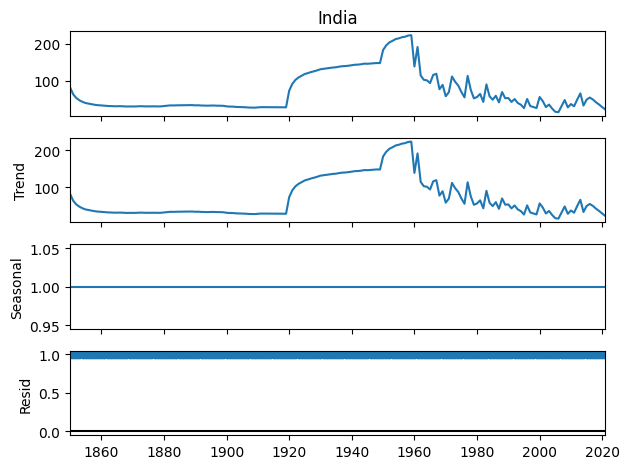

In [26]:
import statsmodels.api as sm

# Decompose the time series into components
result = sm.tsa.seasonal_decompose(df.set_index('year')['India'], model='multiplicative', period=1)
result.plot()
plt.show()

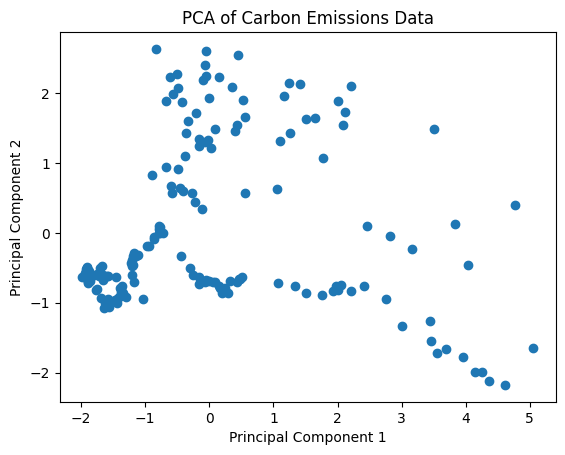

In [27]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data
features = ['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka']
x = df.loc[:, features].values
x = StandardScaler().fit_transform(x)

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x)
principal_df = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2'])
final_df = pd.concat([principal_df, df[['year']]], axis = 1)

# Plotting PCA
plt.figure()
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Carbon Emissions Data')
plt.scatter(final_df['PC1'], final_df['PC2'])
plt.show()

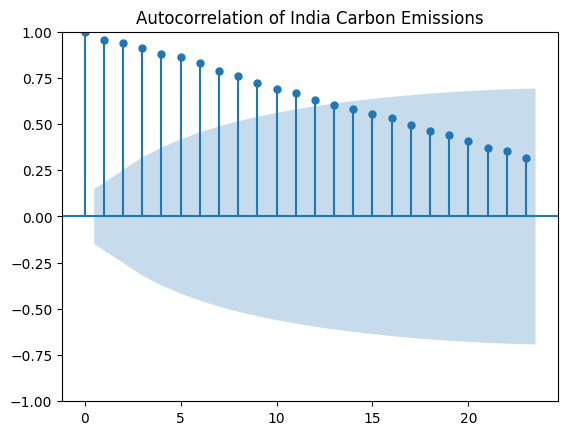

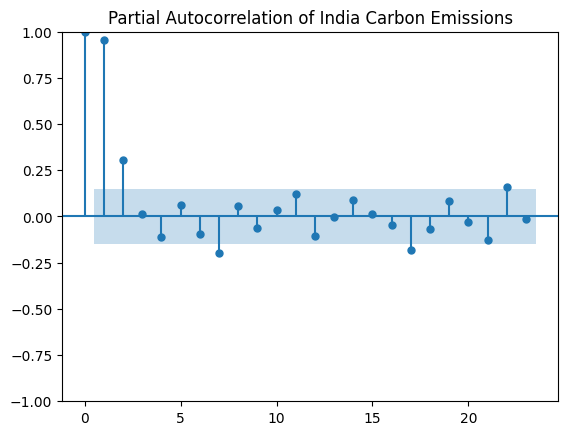

In [28]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Autocorrelation plot
plot_acf(df['India'])
plt.title('Autocorrelation of India Carbon Emissions')
plt.show()

# Partial Autocorrelation plot
plot_pacf(df['India'])
plt.title('Partial Autocorrelation of India Carbon Emissions')
plt.show()

C:\Miniconda3\envs\jupyter-nb\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


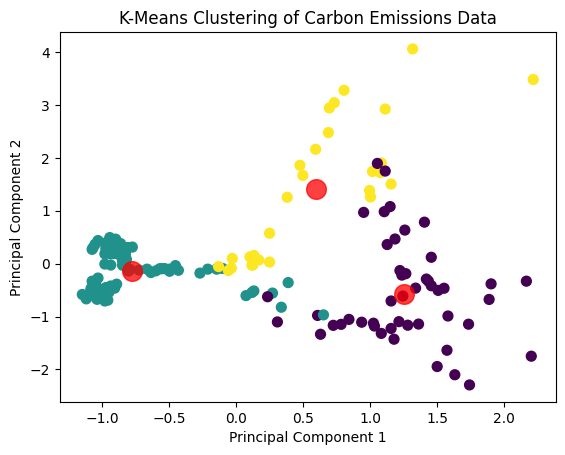

In [29]:
from sklearn.cluster import KMeans

# K-Means Clustering
kmeans = KMeans(n_clusters=3)  # Assuming 3 clusters
kmeans.fit(x)
y_kmeans = kmeans.predict(x)

# Plotting clusters
plt.scatter(x[:, 0], x[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.75)
plt.title('K-Means Clustering of Carbon Emissions Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

## EDA

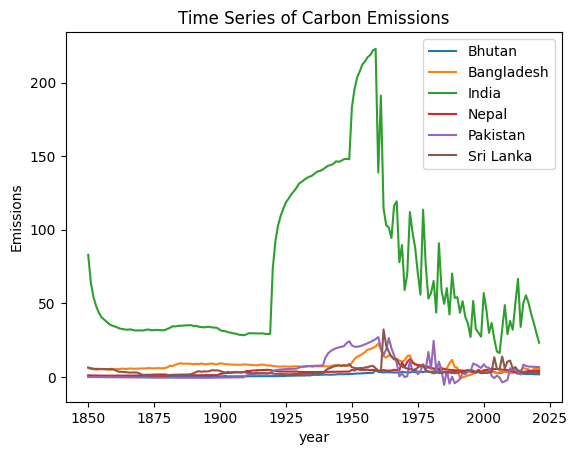

In [31]:
# Line Plot
df.plot(x='year', y=['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka'])
plt.title('Time Series of Carbon Emissions')
plt.ylabel('Emissions')
plt.show()

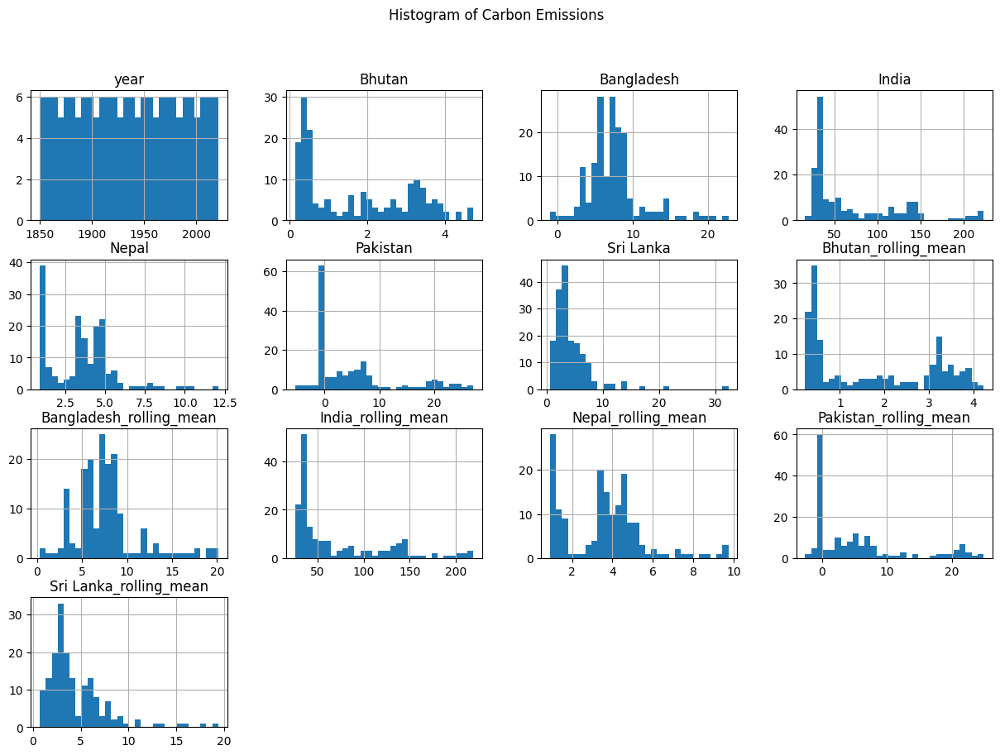

In [32]:
# Histogram 
df.hist(bins=30, figsize=(15, 10))
plt.suptitle('Histogram of Carbon Emissions')
plt.show()

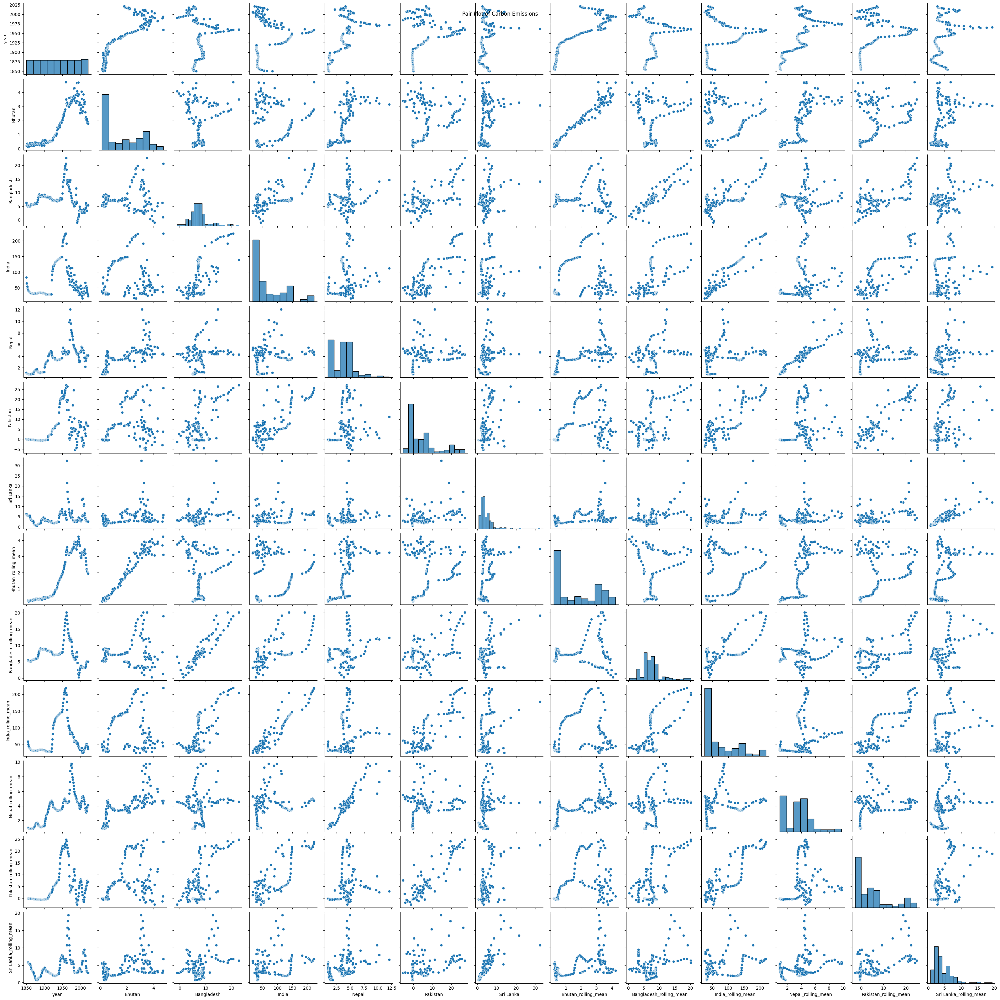

In [33]:
# Pair Plot
sns.pairplot(df)
plt.suptitle('Pair Plot of Carbon Emissions')
plt.show()

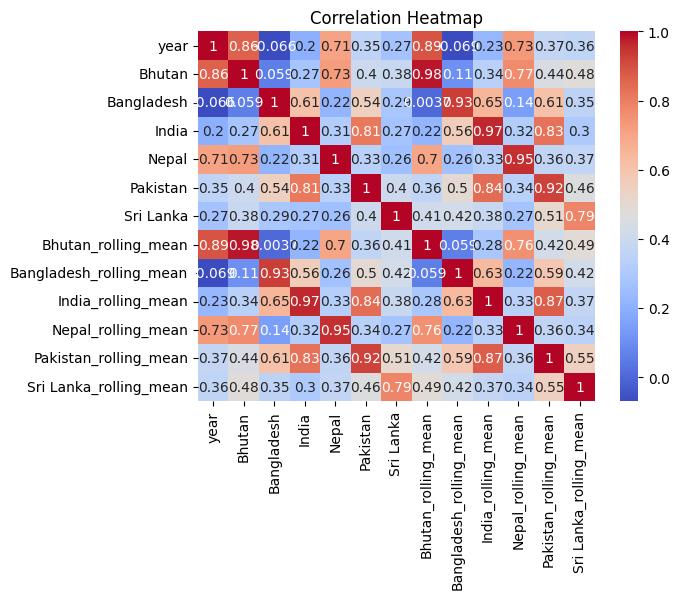

In [34]:
# Heatmap 
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

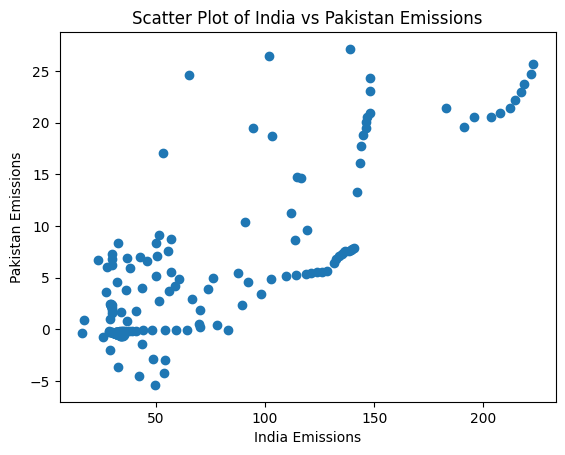

In [35]:
# Scastter Plot
plt.scatter(df['India'], df['Pakistan'])
plt.xlabel('India Emissions')
plt.ylabel('Pakistan Emissions')
plt.title('Scatter Plot of India vs Pakistan Emissions')
plt.show()

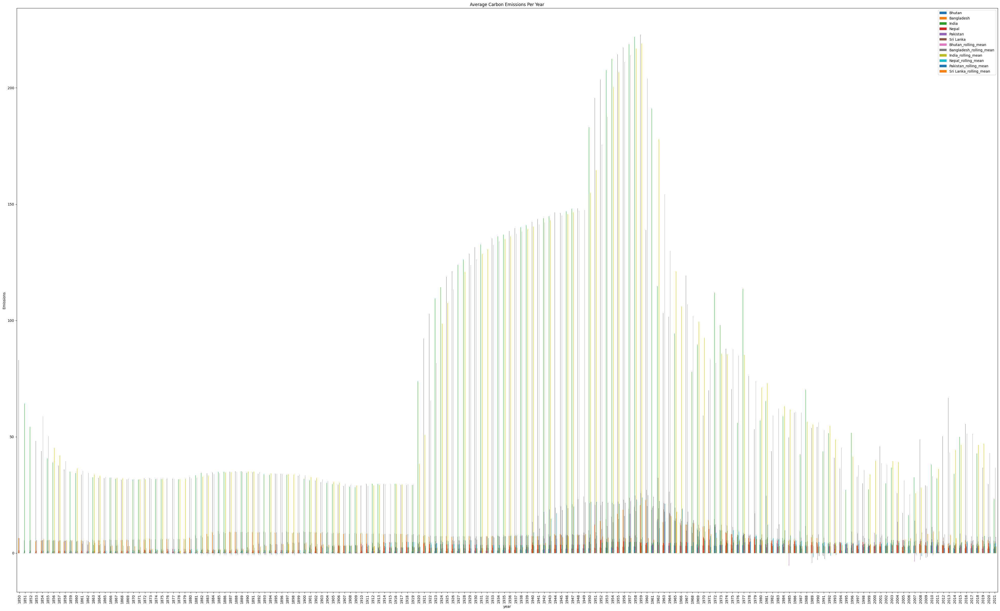

In [42]:
df.groupby('year').mean().plot(kind='bar', figsize=(50, 30))
plt.title('Average Carbon Emissions Per Year')
plt.ylabel('Emissions')
plt.show()

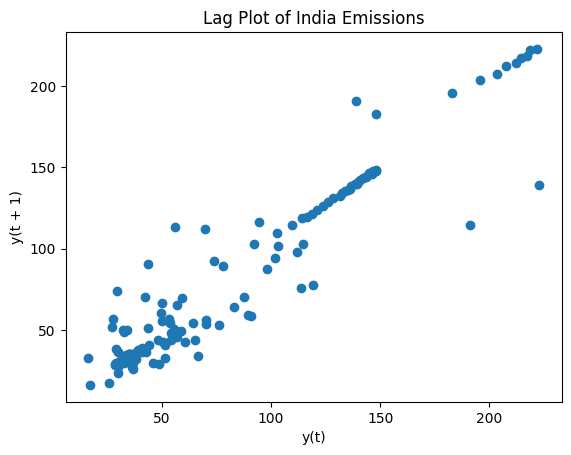

In [44]:
from pandas.plotting import lag_plot
lag_plot(df['India'])
plt.title('Lag Plot of India Emissions')
plt.show()

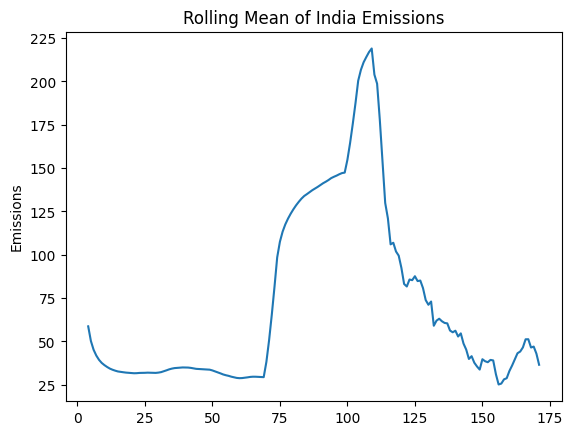

In [45]:
df['India'].rolling(window=5).mean().plot()
plt.title('Rolling Mean of India Emissions')
plt.ylabel('Emissions')
plt.show()

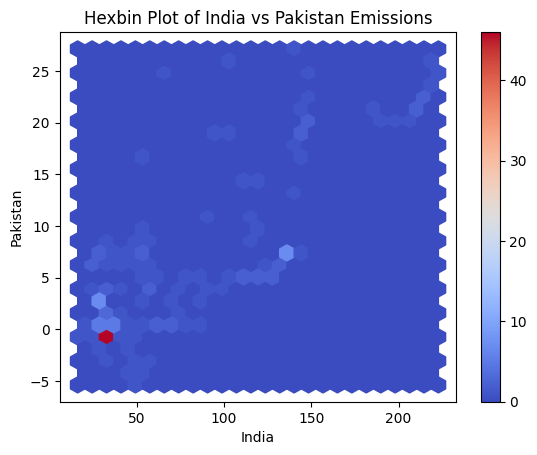

In [48]:
df.plot.hexbin(x='India', y='Pakistan', gridsize=25, cmap='coolwarm')
plt.title('Hexbin Plot of India vs Pakistan Emissions')
plt.show()

C:\Miniconda3\envs\jupyter-nb\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
C:\Miniconda3\envs\jupyter-nb\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
C:\Miniconda3\envs\jupyter-nb\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
C:\Miniconda3\envs\jupyter-nb\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please u

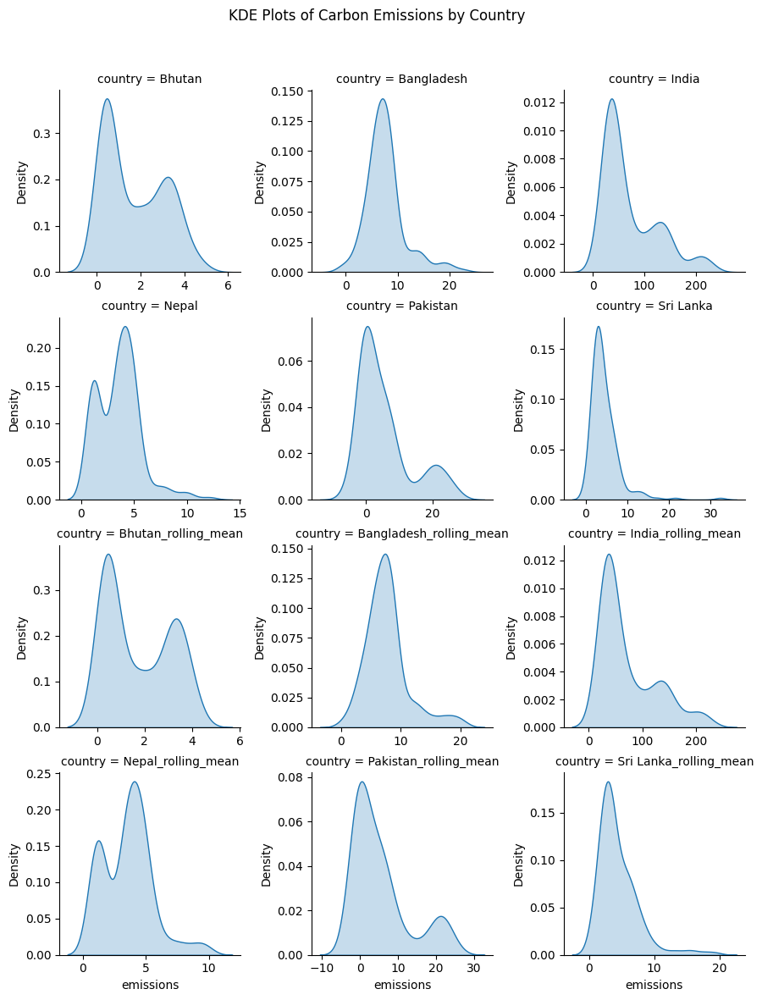

In [50]:
g = sns.FacetGrid(df.melt(id_vars='year', var_name='country', value_name='emissions'), col="country", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, 'emissions', shade=True)
g.fig.suptitle('KDE Plots of Carbon Emissions by Country')
plt.subplots_adjust(top=0.9)
plt.show()

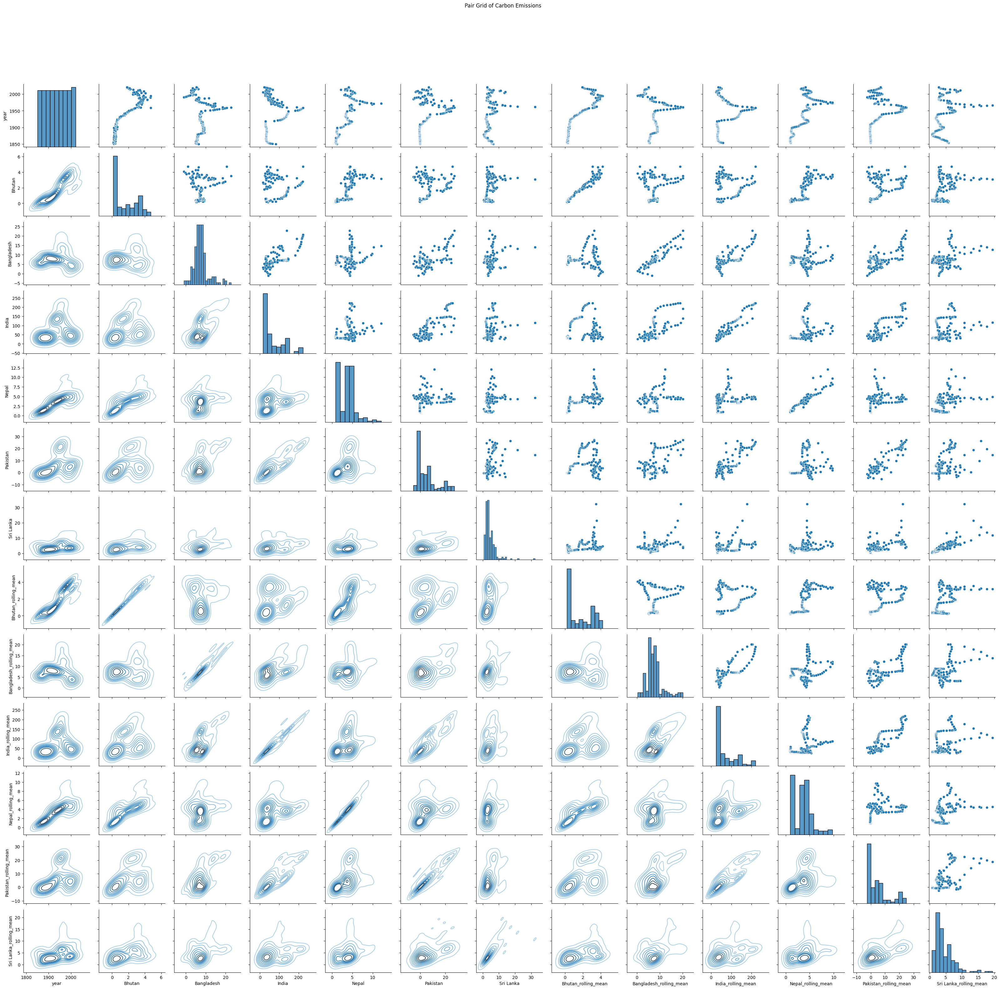

In [51]:
g = sns.PairGrid(df, diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde_kws={"color": "k"})
g.map_lower(sns.kdeplot, cmap='Blues_d')
g.fig.suptitle('Pair Grid of Carbon Emissions')
plt.subplots_adjust(top=0.9)
plt.show()

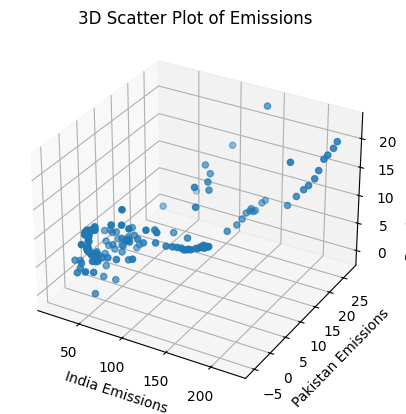

In [52]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['India'], df['Pakistan'], df['Bangladesh'])
ax.set_xlabel('India Emissions')
ax.set_ylabel('Pakistan Emissions')
ax.set_zlabel('Bangladesh Emissions')
plt.title('3D Scatter Plot of Emissions')
plt.show()


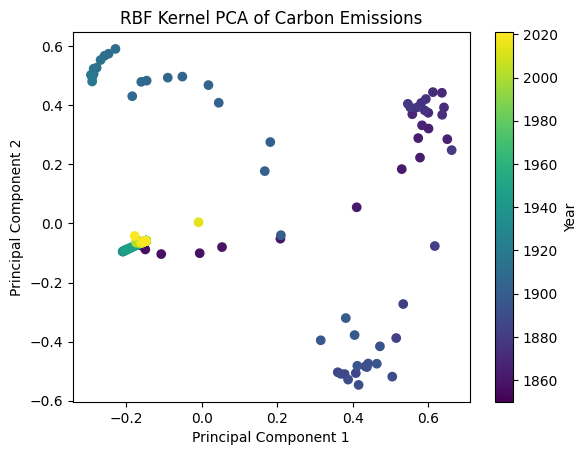

In [54]:
from sklearn.decomposition import KernelPCA

kpca = KernelPCA(kernel='rbf', gamma=0.1)
X_kpca = kpca.fit_transform(df[['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka']])

plt.scatter(X_kpca[:, 0], X_kpca[:, 1], c=df['year'])
plt.title('RBF Kernel PCA of Carbon Emissions')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Year')
plt.show()

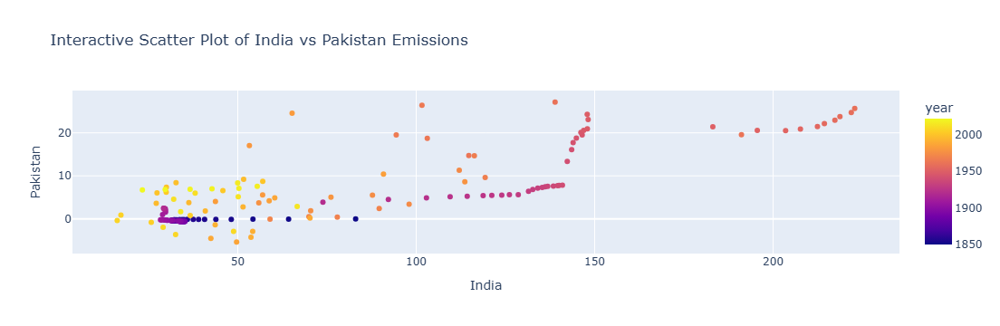

In [55]:
import plotly.express as px

fig = px.scatter(df, x='India', y='Pakistan', color='year', title='Interactive Scatter Plot of India vs Pakistan Emissions')
fig.show()

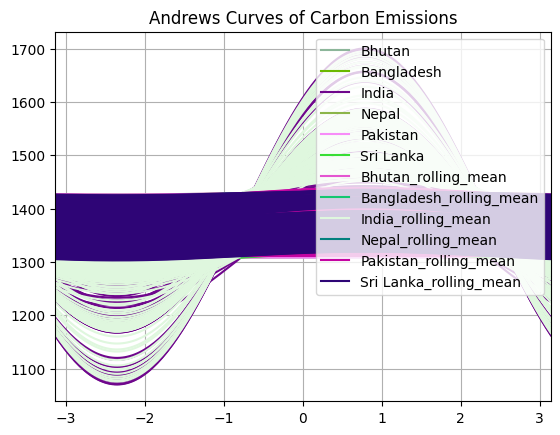

In [56]:
from pandas.plotting import andrews_curves

andrews_curves(df.melt(id_vars='year', var_name='country', value_name='emissions'), 'country')
plt.title('Andrews Curves of Carbon Emissions')
plt.show()

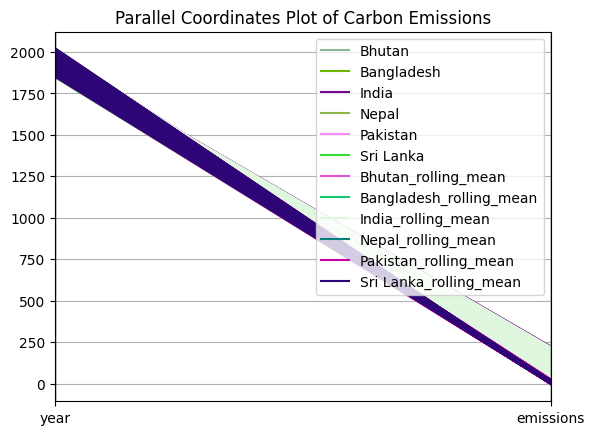

In [57]:
from pandas.plotting import parallel_coordinates

parallel_coordinates(df.melt(id_vars='year', var_name='country', value_name='emissions'), 'country')
plt.title('Parallel Coordinates Plot of Carbon Emissions')
plt.show()

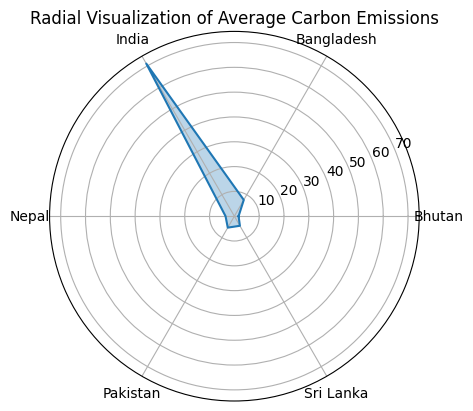

In [58]:
import numpy as np

categories = ['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka']
N = len(categories)

values = df[categories].mean().tolist()
values += values[:1]  # Repeat the first value to close the circle

angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories)
ax.plot(angles, values)
ax.fill(angles, values, alpha=0.3)
plt.title('Radial Visualization of Average Carbon Emissions')
plt.show()

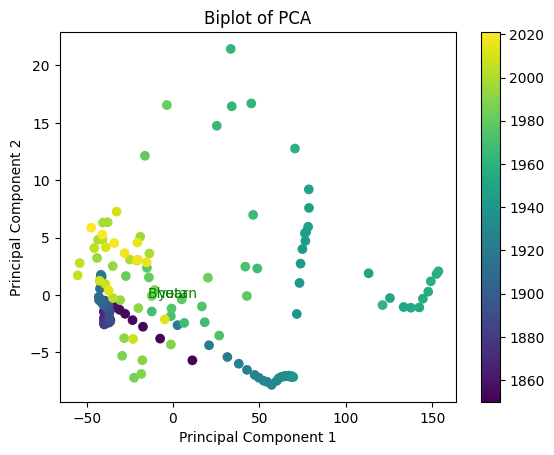

In [59]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df[['Bhutan', 'Bangladesh', 'India', 'Nepal', 'Pakistan', 'Sri Lanka']])

fig, ax = plt.subplots()
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=df['year'])
for i in range(len(pca.components_)):
    ax.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], color='r', alpha=0.5)
    ax.text(pca.components_[0, i] * 1.15, pca.components_[1, i] * 1.15, df.columns[i], color='g', ha='center', va='center')
plt.title('Biplot of PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter)
plt.show()

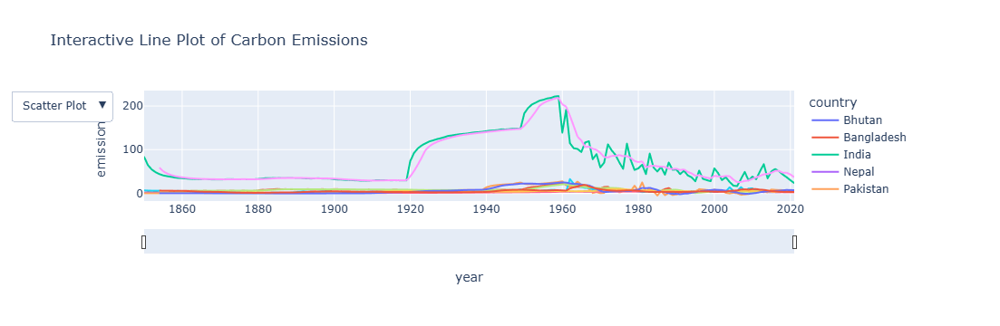

In [61]:
import plotly.express as px
import plotly.graph_objects as go


# Melt the DataFrame to long format for Plotly
df_melted = df.melt(id_vars='year', var_name='country', value_name='emissions')

# Create an interactive line plot
fig = px.line(df_melted, x='year', y='emissions', color='country', title='Interactive Line Plot of Carbon Emissions')

# Add dropdown menu for different types of plots
fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {
                    "args": ["type", "scatter"],
                    "label": "Scatter Plot",
                    "method": "restyle"
                },
                {
                    "args": ["type", "line"],
                    "label": "Line Plot",
                    "method": "restyle"
                },
                {
                    "args": ["type", "bar"],
                    "label": "Bar Plot",
                    "method": "restyle"
                }
            ],
            "direction": "down",
            "showactive": True,
        }
    ]
)

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
    )
)

fig.show()
